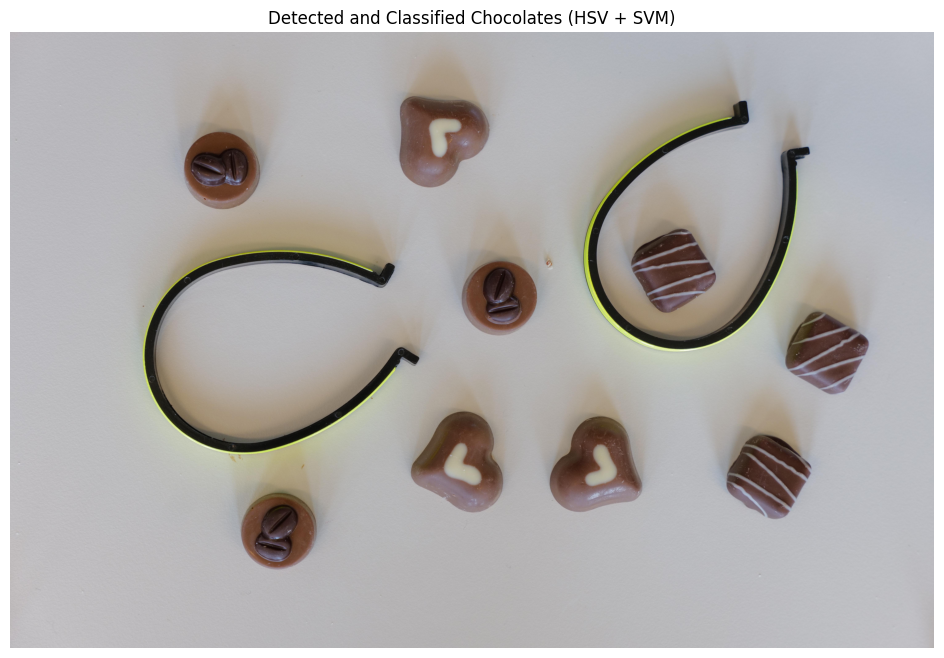

In [30]:
import cv2
import numpy as np
import pandas as pd
import os
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

# --- Feature Extraction ---
from skimage.feature import graycomatrix, graycoprops

def extract_features(img):
    # Color histogram
    hist = cv2.calcHist([img], [0, 1, 2], None, [16, 16, 16], [0, 256, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    hist_flat = hist.flatten()

    # Shape (Hu moments)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    moments = cv2.moments(gray)
    hu = cv2.HuMoments(moments).flatten()
    hu = -np.sign(hu) * np.log10(np.abs(hu) + 1e-6)

    # Texture (GLCM)
    glcm = graycomatrix(gray, [1], [0], 256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    correlation = graycoprops(glcm, 'correlation')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    texture_features = np.array([contrast, correlation, energy, homogeneity])

    return np.concatenate([hist_flat, hu, texture_features])


# --- CLAHE Preprocessing ---
def preprocess_image(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    lab = cv2.merge((cl, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

# --- Load Annotations and Train SVM ---
def train_svm_from_annotations(csv_path, image_dir):
    df = pd.read_csv(csv_path)
    features = []
    labels = []

    for _, row in df.iterrows():
        img_path = os.path.join(image_dir, row['filename'])
        if not os.path.exists(img_path):
            print(f"Missing image: {img_path}")
            continue

        img = cv2.imread(img_path)
        img = preprocess_image(img)
        x1, y1, x2, y2 = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        crop = img[y1:y2, x1:x2]

        if crop.size == 0:
            continue

        feat = extract_features(crop)
        features.append(feat)
        labels.append(row['class'])

    model = make_pipeline(StandardScaler(), SVC(kernel='linear', probability=True))
    model.fit(features, labels)
    return model

# --- Detect Chocolates in Test Image (Using SVM) ---
def detect_and_classify_chocolates(image_path, svm_model):
    image = cv2.imread(image_path)
    orig = image.copy()
    image = preprocess_image(image)

    # --- Convert to HSV ---
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # --- Define HSV range for brown (tweak if needed) ---
    lower_brown = np.array([10, 50, 20])
    upper_brown = np.array([30, 255, 200])
    mask = cv2.inRange(hsv, lower_brown, upper_brown)

    # --- Morphological cleanup ---
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (70, 70))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.dilate(mask, kernel, iterations=1)

    # --- Find and filter contours ---
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    pad = 40
    all_boxes, all_labels = [], []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if not (12000 < area < 60000):
            continue

        x, y, w, h = cv2.boundingRect(cnt)
        cx, cy = x + w // 2, y + h // 2
        side = max(w, h) + pad * 2

        x1 = max(cx - side // 2, 0)
        y1 = max(cy - side // 2, 0)
        x2 = min(x1 + side, image.shape[1])
        y2 = min(y1 + side, image.shape[0])

        roi = image[y1:y2, x1:x2]
        if roi.size == 0:
            continue

        feat = extract_features(roi)
        label = svm_model.predict([feat])[0]
        all_boxes.append((x1, y1, x2, y2))
        all_labels.append(label)

    # --- Draw results ---
    for (x1, y1, x2, y2), label in zip(all_boxes, all_labels):
        cv2.rectangle(orig, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(orig, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    plt.title("Detected and Classified Chocolates (HSV + SVM)")
    plt.axis('off')
    plt.show()


# --- Example Usage ---
if __name__ == '__main__':
    csv_path = r'images\robo\train_annotations.csv'
    image_dir = r'images\robo\train'
    test_img = r'images\robo\valid\L1000843_JPG.rf.d0ff6b97e24839783347db58badb94e9.jpg'

    svm_model = train_svm_from_annotations(csv_path, image_dir)
    detect_and_classify_chocolates(test_img, svm_model)


In [24]:
import cv2
import numpy as np

def nothing(x):
    pass

# Load image
img = cv2.imread('images/robo/valid/L1000843_JPG.rf.d0ff6b97e24839783347db58badb94e9.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Create trackbars
cv2.namedWindow("HSV Threshold")
cv2.createTrackbar("H Min", "HSV Threshold", 10, 180, nothing)
cv2.createTrackbar("H Max", "HSV Threshold", 30, 180, nothing)
cv2.createTrackbar("S Min", "HSV Threshold", 50, 255, nothing)
cv2.createTrackbar("S Max", "HSV Threshold", 255, 255, nothing)
cv2.createTrackbar("V Min", "HSV Threshold", 20, 255, nothing)
cv2.createTrackbar("V Max", "HSV Threshold", 200, 255, nothing)

while True:
    h_min = cv2.getTrackbarPos("H Min", "HSV Threshold")
    h_max = cv2.getTrackbarPos("H Max", "HSV Threshold")
    s_min = cv2.getTrackbarPos("S Min", "HSV Threshold")
    s_max = cv2.getTrackbarPos("S Max", "HSV Threshold")
    v_min = cv2.getTrackbarPos("V Min", "HSV Threshold")
    v_max = cv2.getTrackbarPos("V Max", "HSV Threshold")

    lower = np.array([h_min, s_min, v_min])
    upper = np.array([h_max, s_max, v_max])
    mask = cv2.inRange(hsv, lower, upper)
    result = cv2.bitwise_and(img, img, mask=mask)

    stacked = np.hstack([img, result])
    cv2.imshow("HSV Threshold", stacked)

    if cv2.waitKey(1) & 0xFF == 27:  # Esc to exit
        print("Selected HSV bounds:")
        print("Lower:", lower)
        print("Upper:", upper)
        break

cv2.destroyAllWindows()


TypeError: 'tuple' object is not callable

error: OpenCV(4.11.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window_w32.cpp:2564: error: (-27:Null pointer) NULL window: 'HSV Threshold' in function 'cvGetTrackbarPos'


Image visualizations

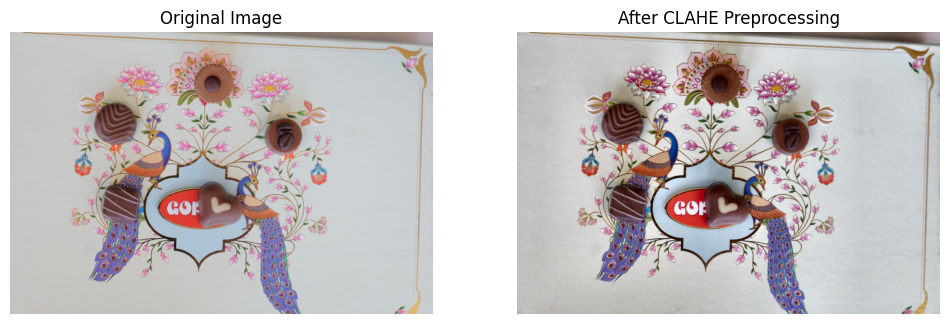

In [26]:
image_path = r'images\robo\valid\L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg'
image = cv2.imread(image_path)
preprocessed = preprocess_image(image)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(preprocessed, cv2.COLOR_BGR2RGB))
plt.title("After CLAHE Preprocessing")
plt.axis('off')
plt.show()


In [32]:
def inspect_hsv_values(image_path):
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Click and print HSV values
    def mouse_callback(event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            pixel = hsv[y, x]
            print(f"HSV at ({x}, {y}): {pixel}")  # Example: [22 180 120]

    cv2.imshow("Click to Get HSV", image)
    cv2.setMouseCallback("Click to Get HSV", mouse_callback)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


In [33]:
import numpy as np

samples = np.array([
    [18, 150, 100],
    [20, 160, 120],
    [22, 140, 110],
    [19, 155, 105]
])

margin = np.array([5, 40, 40])  # tweak this if needed
lower_hsv = np.maximum(np.min(samples, axis=0) - margin, 0)
upper_hsv = np.minimum(np.max(samples, axis=0) + margin, 255)

print("Lower HSV:", lower_hsv)
print("Upper HSV:", upper_hsv)


Lower HSV: [ 13 100  60]
Upper HSV: [ 27 200 160]


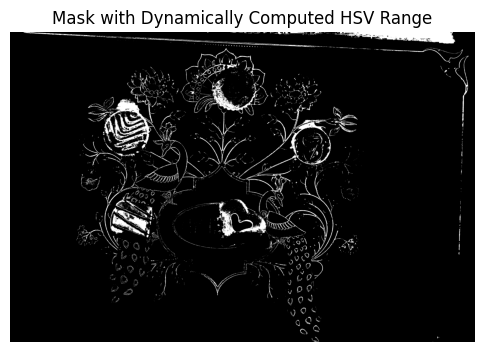

In [38]:
# Preprocess image
image = cv2.imread(image_path)
image = preprocess_image(image)
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Apply computed range
lower = np.array([0, 56, 49])
upper = np.array([38, 153, 156])
mask = cv2.inRange(hsv, lower, upper)

# Display mask
plt.figure(figsize=(6, 6))
plt.imshow(mask, cmap='gray')
plt.title("Mask with Dynamically Computed HSV Range")
plt.axis('off')
plt.show()


In [37]:
import cv2
import numpy as np

def nothing(x):
    pass

# Load image and convert to HSV  # Update this
image_path = r'images\robo\valid\L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg'
image = cv2.imread(image_path)
image = cv2.resize(image, (800, 600))  # Resize if needed
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Create a window
cv2.namedWindow("HSV Tuner")

# Create trackbars for HSV range
cv2.createTrackbar("Low H", "HSV Tuner", 0, 179, nothing)
cv2.createTrackbar("High H", "HSV Tuner", 179, 179, nothing)
cv2.createTrackbar("Low S", "HSV Tuner", 0, 255, nothing)
cv2.createTrackbar("High S", "HSV Tuner", 255, 255, nothing)
cv2.createTrackbar("Low V", "HSV Tuner", 0, 255, nothing)
cv2.createTrackbar("High V", "HSV Tuner", 255, 255, nothing)

while True:
    # Get current positions of all trackbars
    lh = cv2.getTrackbarPos("Low H", "HSV Tuner")
    hh = cv2.getTrackbarPos("High H", "HSV Tuner")
    ls = cv2.getTrackbarPos("Low S", "HSV Tuner")
    hs = cv2.getTrackbarPos("High S", "HSV Tuner")
    lv = cv2.getTrackbarPos("Low V", "HSV Tuner")
    hv = cv2.getTrackbarPos("High V", "HSV Tuner")

    # Define the HSV range
    lower = np.array([lh, ls, lv])
    upper = np.array([hh, hs, hv])

    # Create the mask
    mask = cv2.inRange(hsv, lower, upper)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Show original, mask, and result
    cv2.imshow("Original", image)
    cv2.imshow("Mask", mask)
    cv2.imshow("Filtered Result", result)

    key = cv2.waitKey(1)
    if key == 27:  # ESC to exit
        print("Lower HSV:", lower)
        print("Upper HSV:", upper)
        break

cv2.destroyAllWindows()


KeyboardInterrupt: 

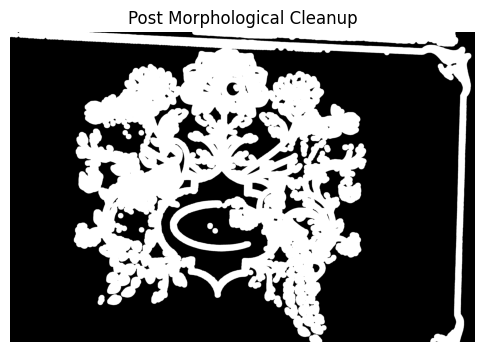

In [40]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (70, 70))
morph = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
morph = cv2.dilate(morph, kernel, iterations=1)

plt.figure(figsize=(6, 6))
plt.imshow(morph, cmap='gray')
plt.title("Post Morphological Cleanup")
plt.axis('off')
plt.show()


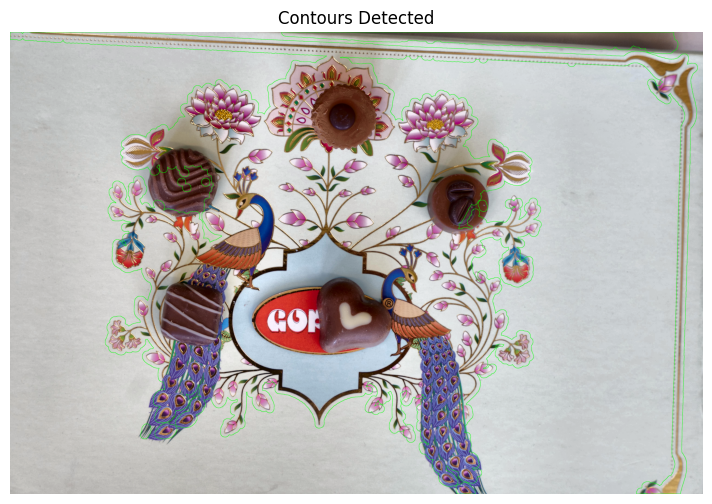

In [41]:
contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = image.copy()
cv2.drawContours(contour_img, contours, -1, (0, 255, 0), 2)

plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
plt.title("Contours Detected")
plt.axis('off')
plt.show()


Fourier descriptors to get contours

In [51]:
from skimage.morphology import remove_small_objects, remove_small_holes, closing, disk, opening
def preprocess(images: np.ndarray):
    """
    Apply the processing step to images to achieve better data uniformity.
    
    Args
    ----
    images: np.ndarray (N, 28, 28)
        Source images

    Return
    ------
    img_process: np.ndarray (N, 28, 28)
        Processed images.
    """

    # Get the shape of input data and set dummy values
    n, d, _ = np.shape(images) 
    img_process = np.zeros_like(images)
    
    # ------------------
    for i in range(n):  # Iterate over images

        # Remove small objects
        cleaned_image = remove_small_objects(remove_small_holes(images[i], 2), 4)

        # Convert back to uint8 format
        img_process[i] = cleaned_image
        
    img_process = img_process.astype(np.uint8)
    # ------------------

    return img_process

In [48]:
from skimage.measure import find_contours

def find_contour(images: np.ndarray):
    """
    Find the contours for the set of images
    
    Args
    ----
    images: np.ndarray (N, 28, 28)
        Source images to process

    Return
    ------
    contours: list of np.ndarray
        List of N arrays containing the coordinates of the contour. Each element of the 
        list is an array of 2d coordinates (K, 2) where K depends on the number of elements 
        that form the contour. 
    """

    # Get number of images to process
    N, _, _ = np.shape(images)
    # Fill in dummy values (fake points)
    contours = [np.array([[0, 0], [1, 1]]) for i in range(N)]

    # ------------------
    for i in range(N):
        image_contours = find_contours(images[i], 0.5)
        
        if len(image_contours) > 0:
            longest_contour = max(image_contours, key=len)
            contours[i] = longest_contour[:, ::-1]
    # ------------------
    
    return contours

In [59]:
import cv2
import numpy as np
import os

image_path = r'images\robo\valid\L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg'
image = cv2.imread(image_path)
contours = find_contour(image)

def get_fourier_descriptor(contour, n_descriptors=32):
    # Handle both OpenCV and skimage contour formats
    if contour.ndim == 3:
        contour_array = contour[:, 0, :]  # OpenCV format: (N, 1, 2)
    elif contour.ndim == 2:
        contour_array = contour  # skimage format: (K, 2)
    else:
        raise ValueError(f"Unexpected contour shape: {contour.shape}")

    # Convert to complex number representation
    complex_contour = contour_array[:, 0] + 1j * contour_array[:, 1]
    fourier_result = np.fft.fft(complex_contour)

    # Normalize: shift, crop, scale
    fourier_result = np.fft.fftshift(fourier_result)
    center = len(fourier_result) // 2
    filtered = fourier_result[center - n_descriptors // 2:center + n_descriptors // 2]

    descriptor = np.abs(filtered)
    if descriptor[0] != 0:
        descriptor = descriptor / descriptor[0]  # Normalize scale

    return descriptor



def extract_largest_contour(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Find contours
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        return None

    # Use the largest one
    largest = max(contours, key=cv2.contourArea)
    return largest

def build_fourier_descriptors(reference_dir, n_descriptors=32):
    descriptors = {}
    for filename in os.listdir(reference_dir):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        label = os.path.splitext(filename)[0]  # e.g., "type1"
        path = os.path.join(reference_dir, filename)
        contour = extract_largest_contour(path)
        if contour is None:
            print(f"Skipping {filename} — no contour found.")
            continue

        fd = get_fourier_descriptor(contour, n_descriptors)
        descriptors[label] = fd
    return descriptors



In [60]:
image_path1 = r'images\robo\valid\L1000843_JPG.rf.d0ff6b97e24839783347db58badb94e9.jpg'
image_path2 = r'images\robo\valid\L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg'
image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)
images_p_1 = preprocess(image1)
images_p_2 = preprocess(image2)
contours1 = find_contour(images_p_1)
contours2 = find_contour(images_p_2)
fd1 = get_fourier_descriptor(contours1[0], n_descriptors=32)
fd2 = get_fourier_descriptor(contours2[0], n_descriptors=32)

C:\Users\sophi\AppData\Local\Temp\ipykernel_24116\3215889804.py:25: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  cleaned_image = remove_small_objects(remove_small_holes(images[i], 2), 4)


In [47]:
reference_dir = r'images\references'
reference_descriptor = build_fourier_descriptors(reference_dir)

New

In [61]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import remove_small_objects, remove_small_holes
from skimage.measure import find_contours

# ---------- Preprocessing ----------
def preprocess(images: np.ndarray):
    n, d, _ = np.shape(images) 
    img_process = np.zeros_like(images)
    
    for i in range(n):
        cleaned_image = remove_small_objects(remove_small_holes(images[i], 2), 4)
        img_process[i] = cleaned_image

    return img_process.astype(np.uint8)

# ---------- Contour Extraction (for skimage or cv2) ----------
def find_contour(images: np.ndarray):
    N, _, _ = images.shape
    contours = [np.array([[0, 0], [1, 1]]) for _ in range(N)]

    for i in range(N):
        image_contours = find_contours(images[i], 0.5)
        if len(image_contours) > 0:
            longest_contour = max(image_contours, key=len)
            contours[i] = longest_contour[:, ::-1]
    return contours

def extract_largest_contour_cv(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        return None, gray

    largest = max(contours, key=cv2.contourArea)
    return largest, gray

# ---------- Fourier Descriptor ----------
def get_fourier_descriptor(contour, n_descriptors=32):
    if contour.ndim == 3:
        contour_array = contour[:, 0, :]  # OpenCV
    elif contour.ndim == 2:
        contour_array = contour  # skimage
    else:
        raise ValueError(f"Unexpected contour shape: {contour.shape}")

    complex_contour = contour_array[:, 0] + 1j * contour_array[:, 1]
    fourier_result = np.fft.fft(complex_contour)
    fourier_result = np.fft.fftshift(fourier_result)

    center = len(fourier_result) // 2
    filtered = fourier_result[center - n_descriptors // 2:center + n_descriptors // 2]

    descriptor = np.abs(filtered)
    if descriptor[0] != 0:
        descriptor = descriptor / descriptor[0]

    return descriptor

# ---------- Build Descriptors from Reference Images ----------
def build_fourier_descriptors(reference_dir, n_descriptors=32, visualize=False):
    descriptors = {}

    for filename in os.listdir(reference_dir):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        label = os.path.splitext(filename)[0]
        path = os.path.join(reference_dir, filename)
        contour, gray = extract_largest_contour_cv(path)
        if contour is None:
            print(f"Skipping {filename} — no contour found.")
            continue

        fd = get_fourier_descriptor(contour, n_descriptors)
        descriptors[label] = fd

        if visualize:
            visualize_contour_and_fd(gray, contour, fd, label)

    return descriptors

# ---------- Visualization ----------
def visualize_contour_and_fd(image, contour, descriptor, title):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title(f"Original: {title}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    contour_points = contour[:, 0, :] if contour.ndim == 3 else contour
    plt.imshow(image, cmap='gray')
    plt.plot(contour_points[:, 0], contour_points[:, 1], linewidth=2, color='red')
    plt.title("Extracted Contour")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.plot(descriptor)
    plt.title("Fourier Descriptor (Magnitude)")
    plt.grid(True)

    plt.tight_layout()
    plt.show()


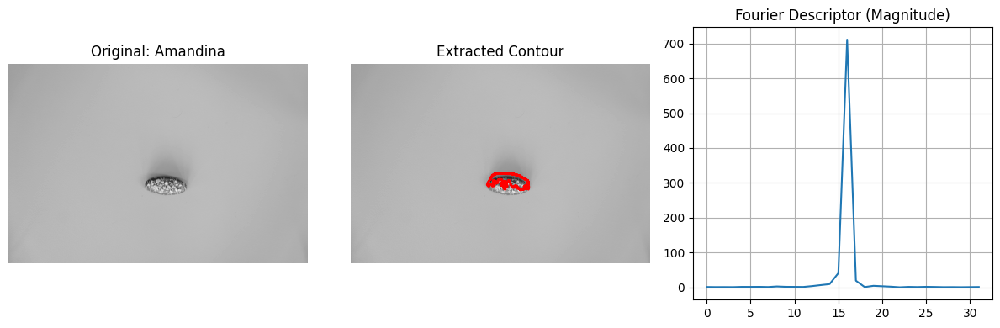

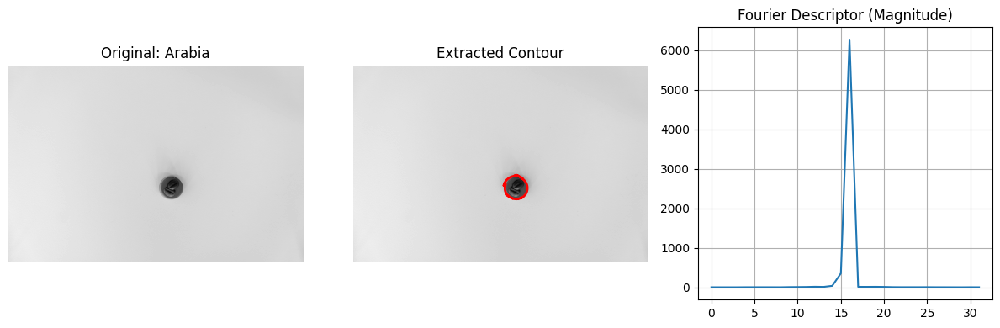

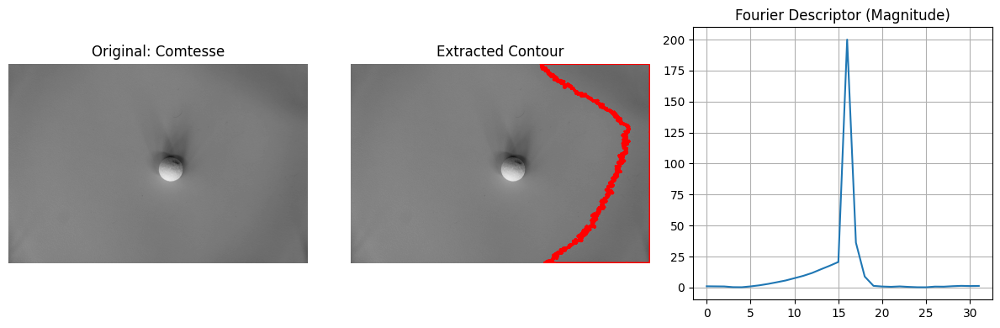

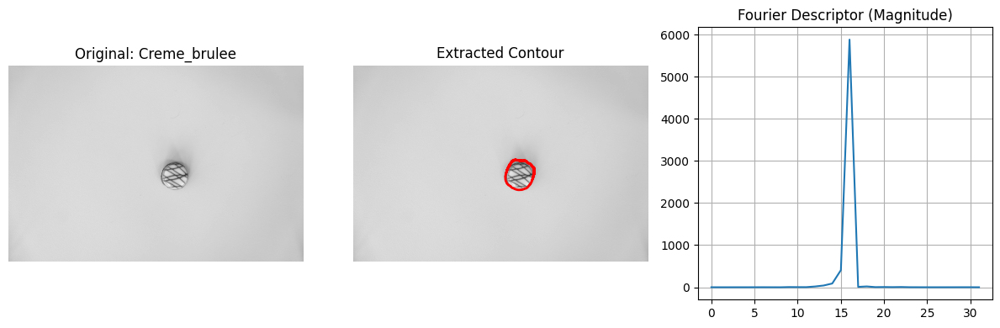

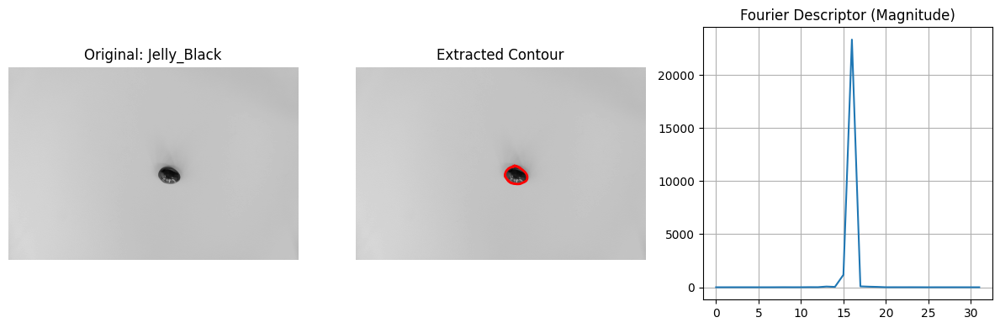

...

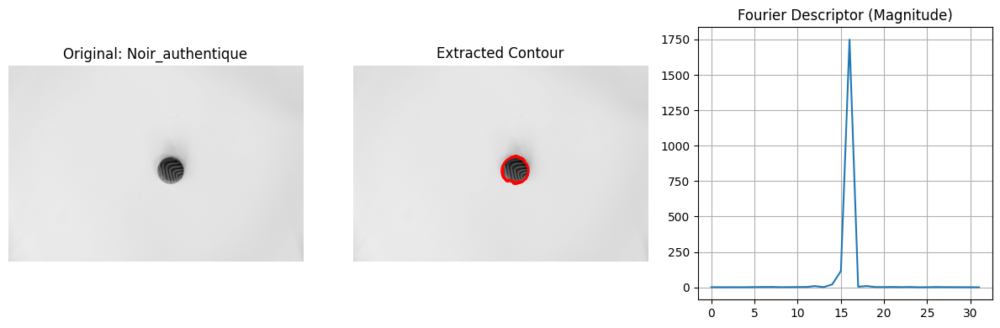

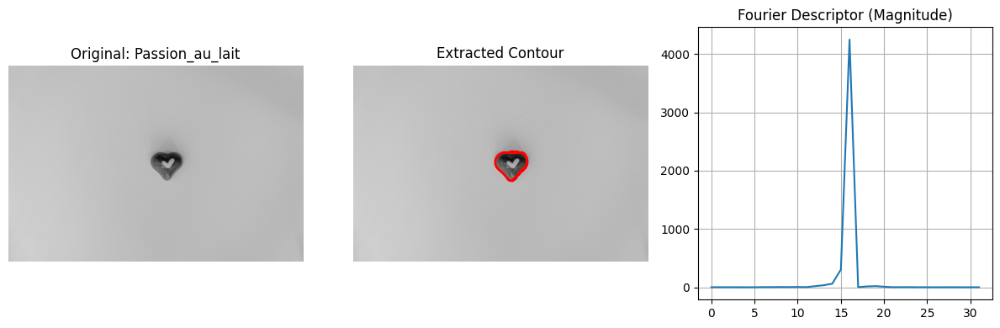

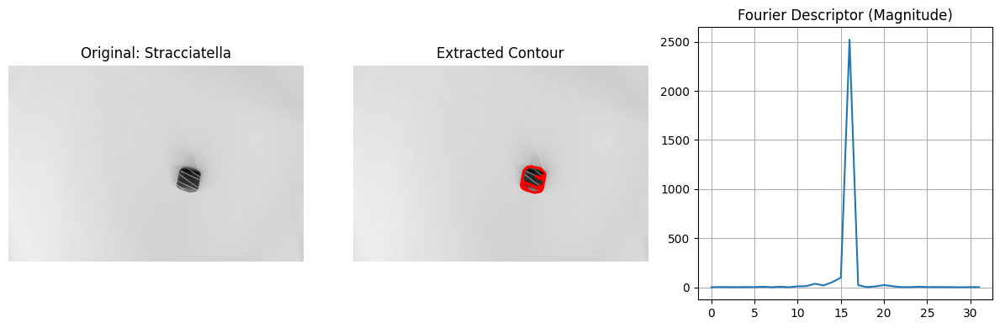

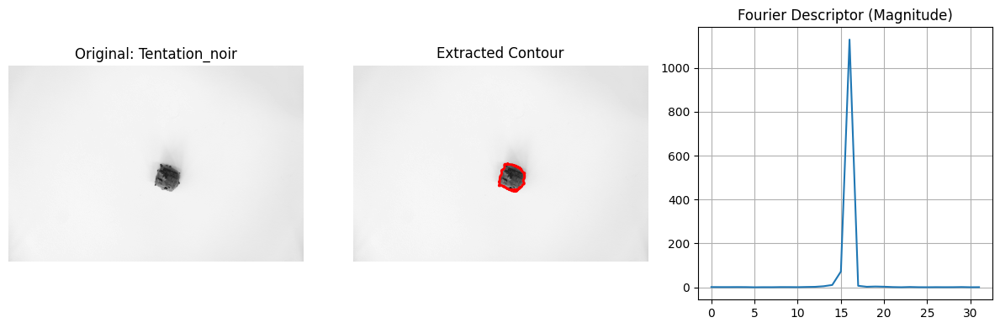

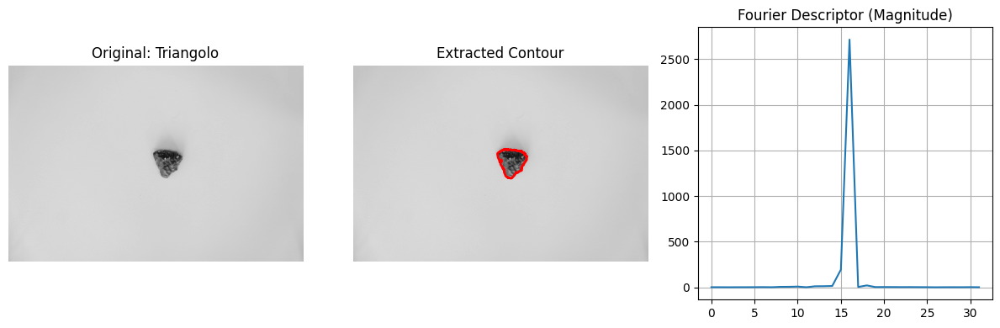

In [62]:
reference_dir = r'images\references'
descriptors = build_fourier_descriptors(reference_dir, n_descriptors=32, visualize=True)


In [73]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from sklearn.cluster import KMeans
from skimage.measure import find_contours
from scipy.spatial.distance import euclidean

# ---------- Visualization ----------
def draw_contours(image, contours, labels=None):
    boxed = image.copy()
    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt.astype(np.int32))
        cv2.rectangle(boxed, (x, y), (x + w, y + h), (0, 255, 0), 3)
        if labels and i < len(labels):
            cv2.putText(boxed, labels[i], (x, y + 40), cv2.FONT_HERSHEY_SIMPLEX,
                        2.0, (0, 0, 255), 4, lineType=cv2.LINE_AA)
    return boxed

def display_results(orig, clustered, contours, labels):
    clustered_boxes = draw_contours(clustered, contours)
    original_boxes = draw_contours(orig.copy(), contours)
    labeled_img = draw_contours(orig.copy(), contours, labels)

    fig, axs = plt.subplots(1, 3, figsize=(20, 8))
    axs[0].imshow(cv2.cvtColor(clustered_boxes, cv2.COLOR_BGR2RGB))
    axs[0].set_title('K-means with BBoxes', fontsize=24)
    axs[1].imshow(cv2.cvtColor(original_boxes, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Original with BBoxes', fontsize=24)
    axs[2].imshow(cv2.cvtColor(labeled_img, cv2.COLOR_BGR2RGB))
    axs[2].set_title('Final Classification', fontsize=24)
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# ---------- K-means + Mask ----------
def kmeans_clustering(image, k=4):
    Z = image.reshape((-1, 3)).astype(np.float32)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(Z)
    labels = kmeans.labels_.reshape(image.shape[:2])
    clustered_img = kmeans.cluster_centers_[labels].reshape(image.shape).astype(np.uint8)
    return clustered_img, labels

def extract_class_masks(labels, num_classes=4):
    return [np.uint8(labels == i) * 255 for i in range(num_classes)]

def clean_mask(mask):
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
    kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel_close)
    dilated = cv2.dilate(closed, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7)), iterations=1)
    return dilated

# ---------- Skimage-based Contour Extraction ----------
def get_contours_from_mask(mask, min_area=1500, size_range=(450, 700)):
    contours_raw = find_contours(mask, level=0.5)
    filtered_contours = []
    for contour in contours_raw:
        contour_xy = contour[:, ::-1]
        x, y, w, h = cv2.boundingRect(contour_xy.astype(np.int32))
        area = cv2.contourArea(contour_xy.astype(np.int32))
        if area > min_area and size_range[0] <= w <= size_range[1] and size_range[0] <= h <= size_range[1]:
            filtered_contours.append(contour_xy)
    return filtered_contours

# ---------- Fourier Descriptor ----------
def extract_fourier_descriptor(contour, n_descriptors=32):
    if contour.ndim == 3:
        contour_array = contour[:, 0, :]
    else:
        contour_array = contour
    complex_contour = contour_array[:, 0] + 1j * contour_array[:, 1]
    fourier_result = np.fft.fft(complex_contour)
    fourier_result = np.fft.fftshift(fourier_result)
    center = len(fourier_result) // 2
    filtered = fourier_result[center - n_descriptors // 2:center + n_descriptors // 2]
    descriptor = np.abs(filtered)
    return descriptor / descriptor[0] if descriptor[0] != 0 else descriptor

def match_fourier_descriptor(fd, reference_descriptors):
    scores = {label: euclidean(fd, ref_fd) for label, ref_fd in reference_descriptors.items()}
    return min(scores, key=scores.get)

def load_reference_fourier_descriptors(ref_folder, k=4, n_descriptors=32):
    descriptors = {}
    for path in glob(os.path.join(ref_folder, '*.jpg')):
        img = cv2.imread(path)
        clustered_img, labels = kmeans_clustering(img, k)
        masks = extract_class_masks(labels)
        for mask in masks:
            cleaned = clean_mask(mask)
            contours = get_contours_from_mask(cleaned)
            if contours:
                fd = extract_fourier_descriptor(contours[0], n_descriptors)
                class_name = os.path.basename(path).split('_JPG')[0]
                descriptors[class_name] = fd
                break
    return descriptors

# ---------- Full Pipeline Using Fourier ----------
def process_image_fourier(img_path, reference_descriptors, n_descriptors=32):
    img = cv2.imread(img_path)
    clustered_img, labels = kmeans_clustering(img, k=4)
    class_masks = extract_class_masks(labels)

    all_contours = []
    all_labels = []

    for mask in class_masks:
        cleaned = clean_mask(mask)
        contours = get_contours_from_mask(cleaned)
        for cnt in contours:
            fd = extract_fourier_descriptor(cnt, n_descriptors)
            best_label = match_fourier_descriptor(fd, reference_descriptors)
            all_contours.append(cnt)
            all_labels.append(best_label)

    display_results(img, clustered_img, all_contours, all_labels)



Processing Jelly_Black_JPG.rf.ba677d7e4559a26895d032b5bb1b8964.jpg


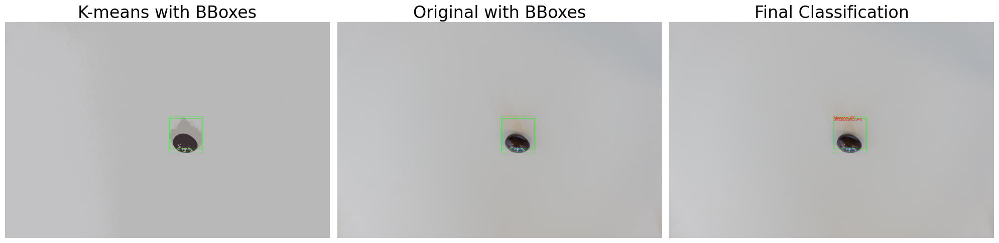


Processing L1000763_JPG.rf.7044b4073155c89c7d9f8b8d6d24b225.jpg


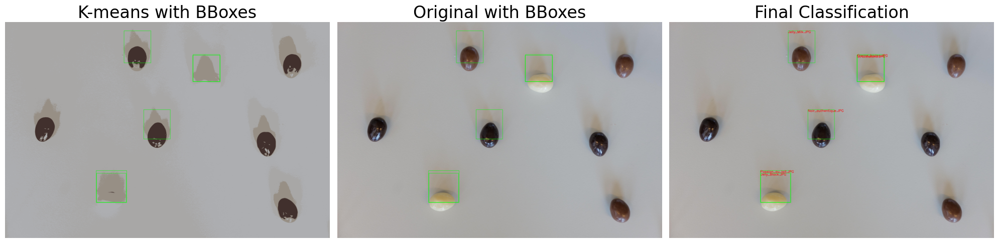


Processing L1000797_JPG.rf.df1df24e57ff27605ddd1cd4ed1b8562.jpg


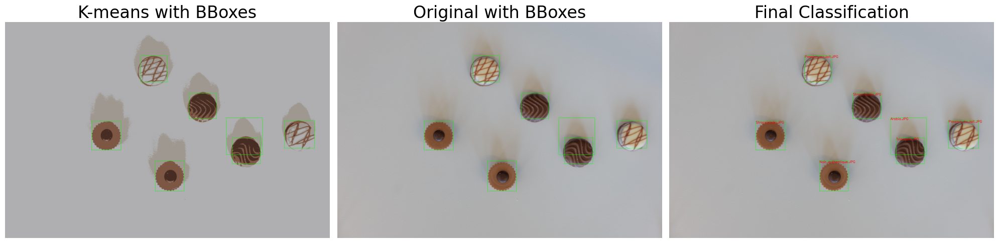


Processing L1000810_JPG.rf.452ec701d58eb7f77c9e012264360961.jpg


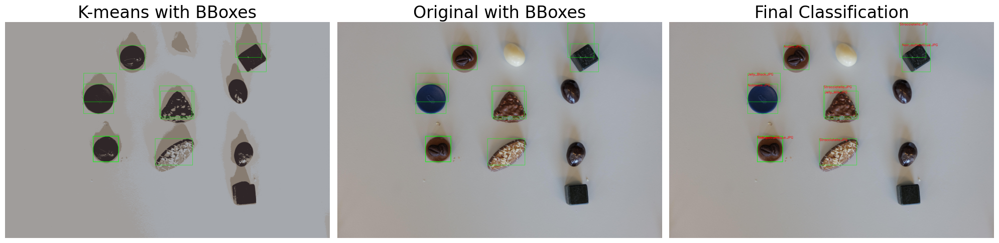


Processing L1000843_JPG.rf.d0ff6b97e24839783347db58badb94e9.jpg


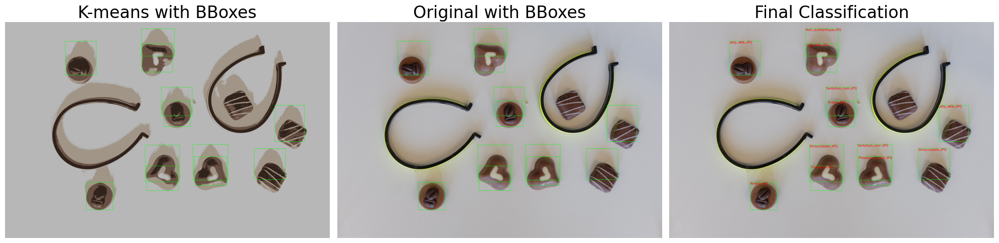


Processing L1000854_JPG.rf.8cf09ce5c39d34a75e01bd8c5e1562cf.jpg


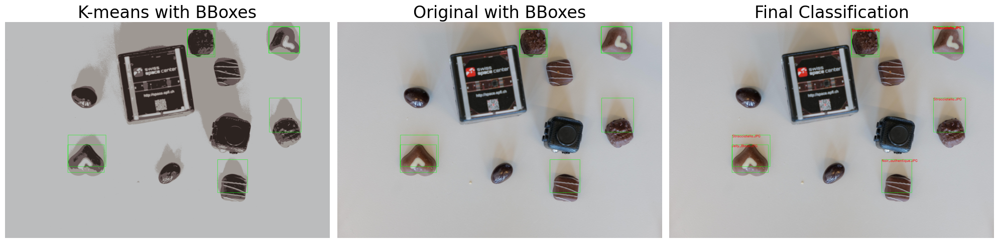


Processing L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg


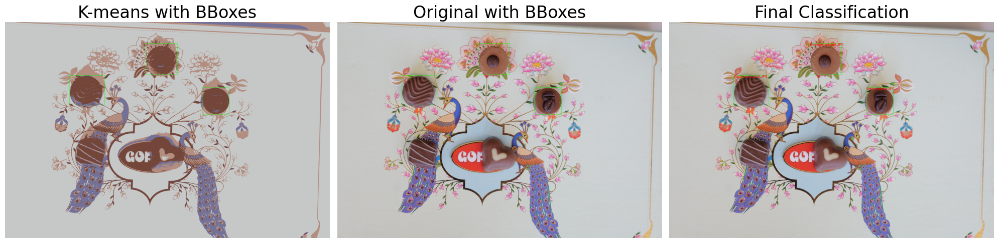


Processing L1000910_JPG.rf.885dd5dbbeddabd94af45e77bfcdd458.jpg


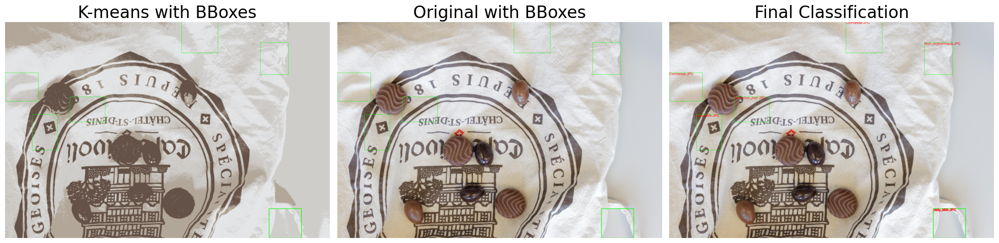


Processing L1000914_JPG.rf.b8834d031b3e1518c8838176a05da276.jpg


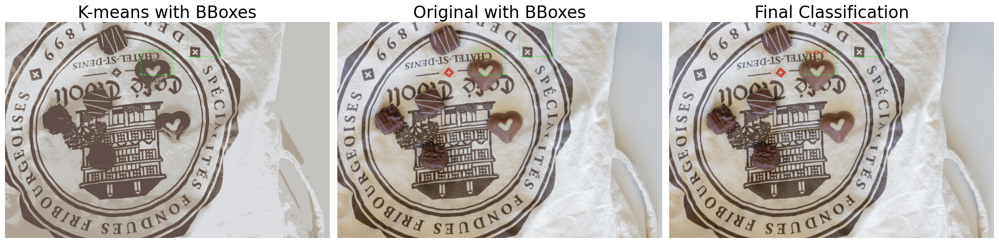


Processing L1000916_JPG.rf.93edcce57def6e66bed60f342fea96b2.jpg


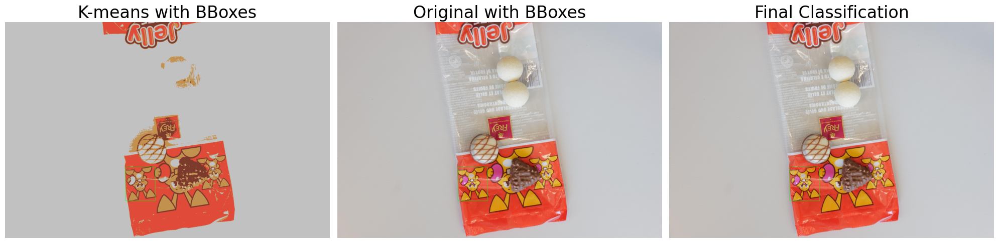


Processing L1000939_JPG.rf.19845d7b5e3667e08b29788189ca4723.jpg


KeyboardInterrupt: 

In [74]:
reference_folder = r'images\references'
test_folder = r'images\robo\valid'

# Load reference Fourier descriptors
reference_fds = load_reference_fourier_descriptors(reference_folder)

# Run classification on test images
for test_path in glob(os.path.join(test_folder, '*.jpg')):
    print(f"\nProcessing {os.path.basename(test_path)}")
    process_image_fourier(test_path, reference_fds)


In [75]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from scipy.spatial.distance import euclidean

# ---------- Preprocessing (Optional, not used here) ----------
from skimage.morphology import remove_small_objects, remove_small_holes

def preprocess(images: np.ndarray):
    n, d, _ = np.shape(images)
    img_process = np.zeros_like(images)
    for i in range(n):
        cleaned_image = remove_small_objects(remove_small_holes(images[i], 2), 4)
        img_process[i] = cleaned_image
    return img_process.astype(np.uint8)

# ---------- Threshold-Based Contour Extraction ----------
def extract_largest_contour_cv(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        return None, image, gray

    largest = max(contours, key=cv2.contourArea)
    return largest, image, gray

# ---------- Fourier Descriptor ----------
def get_fourier_descriptor(contour, n_descriptors=32):
    if contour.ndim == 3:
        contour_array = contour[:, 0, :]  # OpenCV
    else:
        contour_array = contour  # Already (N, 2)
    complex_contour = contour_array[:, 0] + 1j * contour_array[:, 1]
    fourier_result = np.fft.fft(complex_contour)
    fourier_result = np.fft.fftshift(fourier_result)
    center = len(fourier_result) // 2
    filtered = fourier_result[center - n_descriptors // 2:center + n_descriptors // 2]
    descriptor = np.abs(filtered)
    return descriptor / descriptor[0] if descriptor[0] != 0 else descriptor

# ---------- Visualization ----------
def visualize_contour_and_fd(image, contour, descriptor, title):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title(f"Original: {title}")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    contour_points = contour[:, 0, :] if contour.ndim == 3 else contour
    plt.imshow(image, cmap='gray')
    plt.plot(contour_points[:, 0], contour_points[:, 1], linewidth=2, color='red')
    plt.title("Extracted Contour")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.plot(descriptor)
    plt.title("Fourier Descriptor (Magnitude)")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# ---------- Reference Descriptor Builder ----------
def build_fourier_descriptors(reference_dir, n_descriptors=32, visualize=False):
    descriptors = {}
    for filename in os.listdir(reference_dir):
        if not filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        label = os.path.splitext(filename)[0]
        path = os.path.join(reference_dir, filename)
        contour, image, gray = extract_largest_contour_cv(path)
        if contour is None:
            print(f"Skipping {filename} — no contour found.")
            continue

        fd = get_fourier_descriptor(contour, n_descriptors)
        descriptors[label] = fd

        if visualize:
            visualize_contour_and_fd(gray, contour, fd, label)

    return descriptors

# ---------- Matcher ----------
def match_fourier_descriptor(fd, reference_descriptors):
    scores = {label: euclidean(fd, ref_fd) for label, ref_fd in reference_descriptors.items()}
    return min(scores, key=scores.get)

# ---------- Full Test Pipeline ----------
def process_test_images(test_folder, reference_descriptors, n_descriptors=32, visualize=True):
    for test_path in glob(os.path.join(test_folder, '*.jpg')):
        filename = os.path.basename(test_path)
        print(f"\nProcessing {filename}")

        contour, image, gray = extract_largest_contour_cv(test_path)
        if contour is None:
            print(f"  No contour found in {filename}.")
            continue

        fd = get_fourier_descriptor(contour, n_descriptors)
        label = match_fourier_descriptor(fd, reference_descriptors)
        print(f"  Classified as: {label}")

        if visualize:
            visualize_contour_and_fd(gray, contour, fd, f"{filename} → {label}")


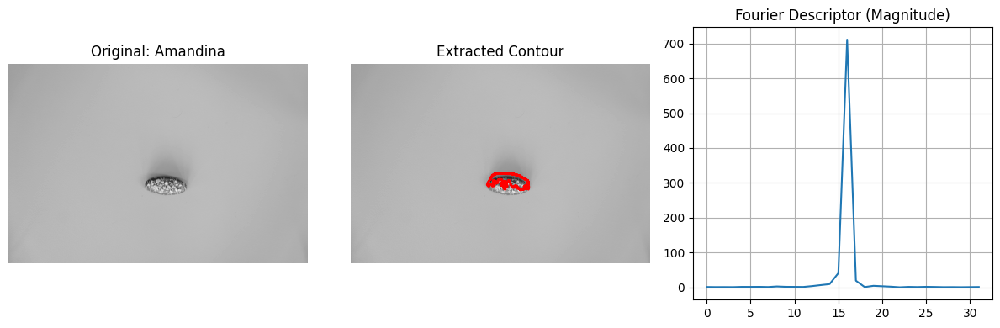

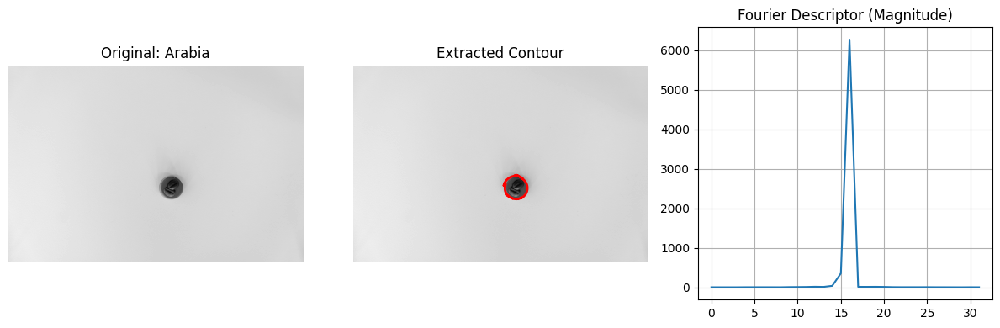

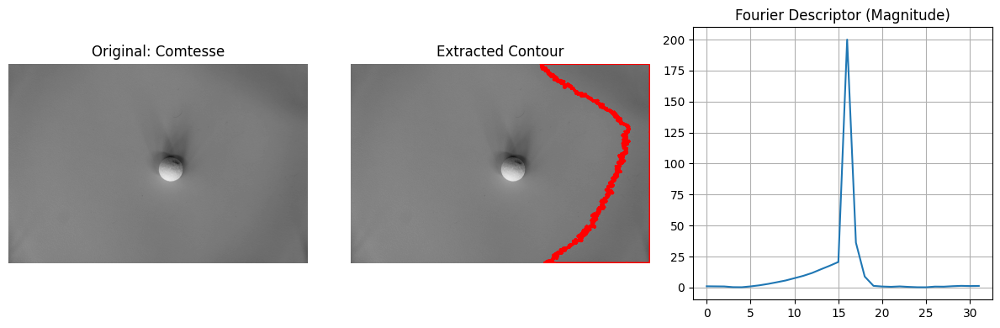

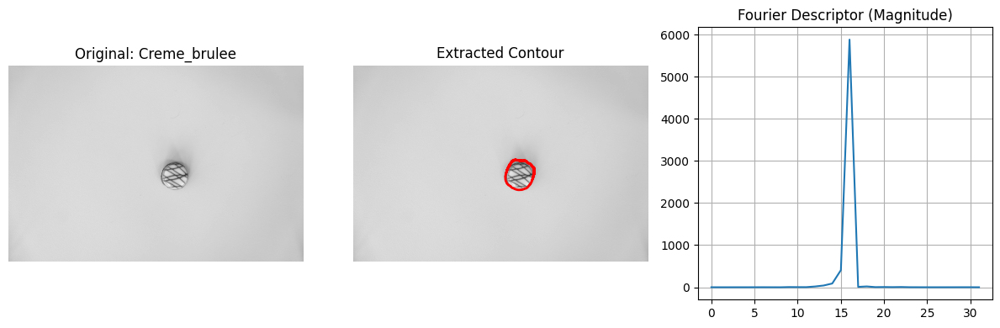

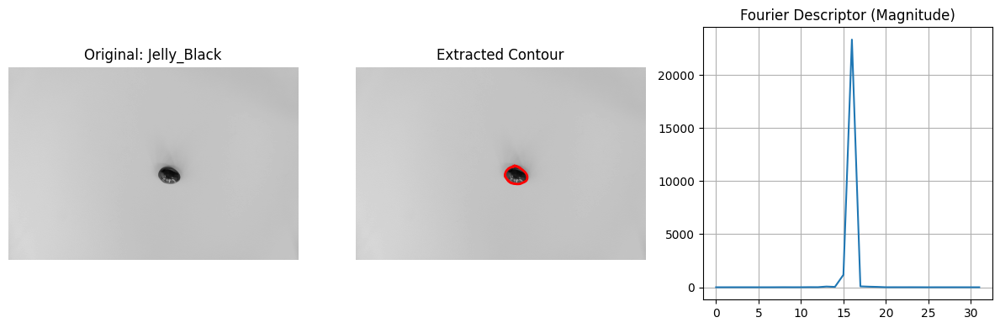

...

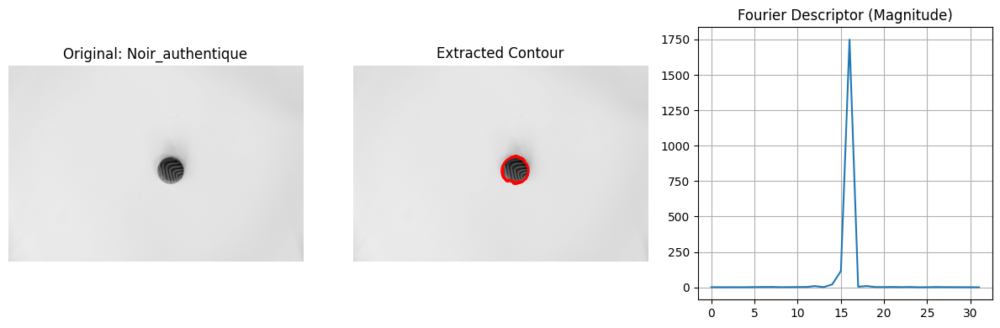

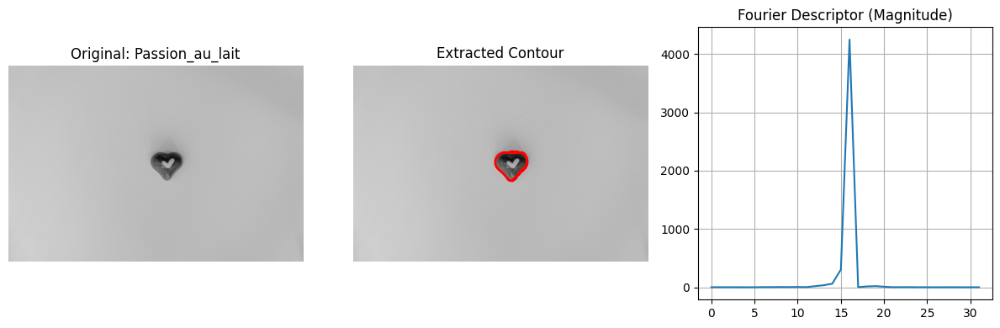

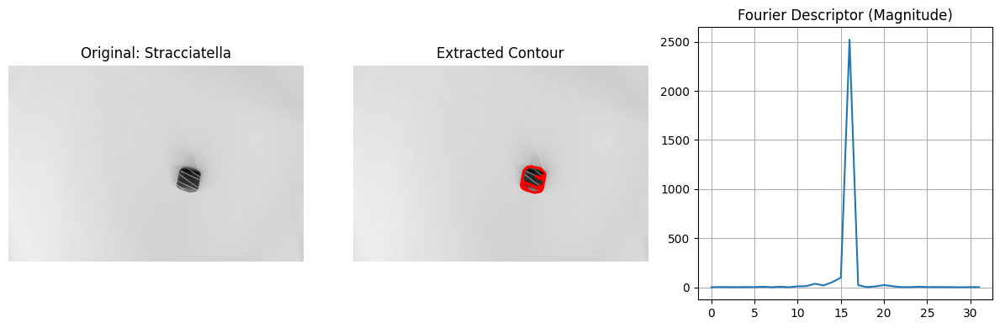

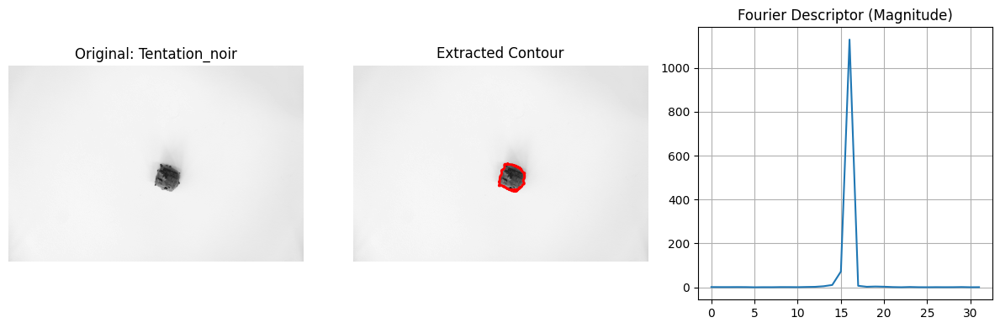

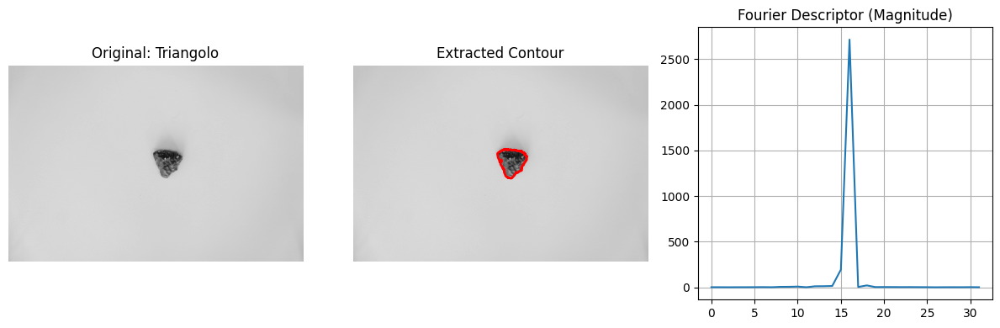


Processing Jelly_Black_JPG.rf.ba677d7e4559a26895d032b5bb1b8964.jpg
  Classified as: Jelly_Black


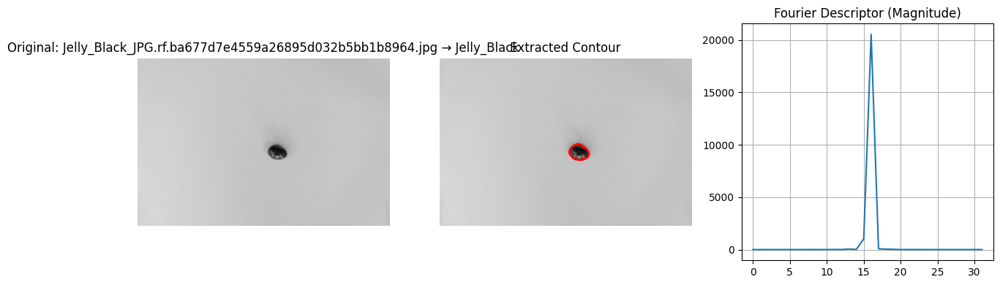


Processing L1000763_JPG.rf.7044b4073155c89c7d9f8b8d6d24b225.jpg
  Classified as: Jelly_Black


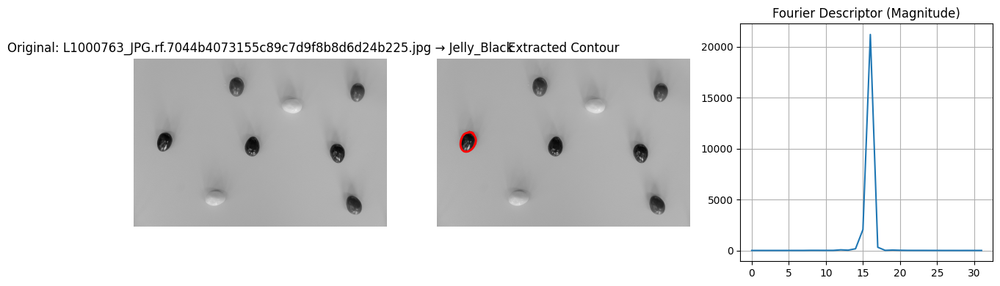


Processing L1000797_JPG.rf.df1df24e57ff27605ddd1cd4ed1b8562.jpg
  Classified as: Noblesse


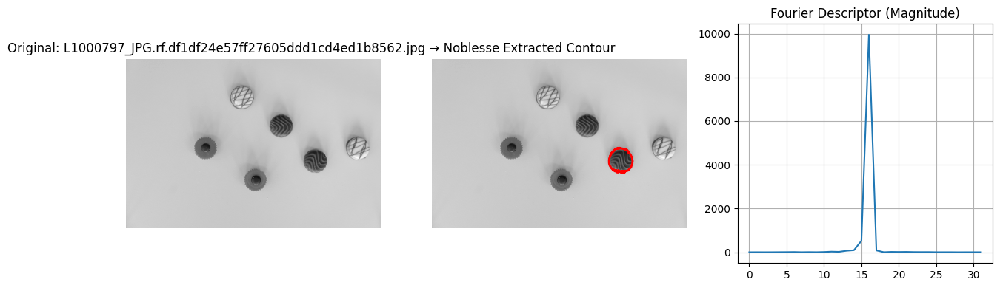


Processing L1000810_JPG.rf.452ec701d58eb7f77c9e012264360961.jpg
  Classified as: Jelly_Black


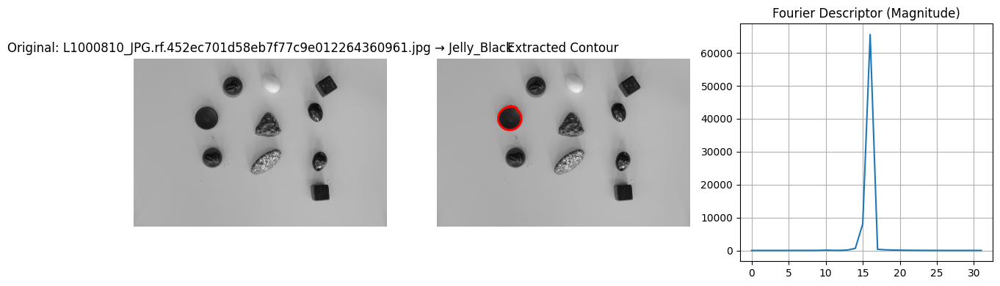


Processing L1000843_JPG.rf.d0ff6b97e24839783347db58badb94e9.jpg
  Classified as: Comtesse


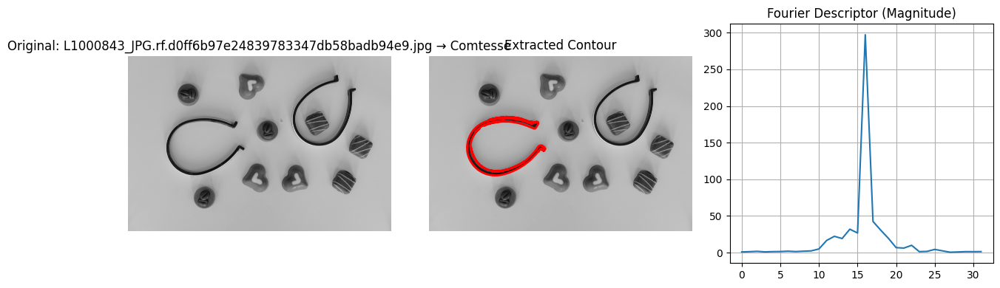


Processing L1000854_JPG.rf.8cf09ce5c39d34a75e01bd8c5e1562cf.jpg
  Classified as: Tentation_noir


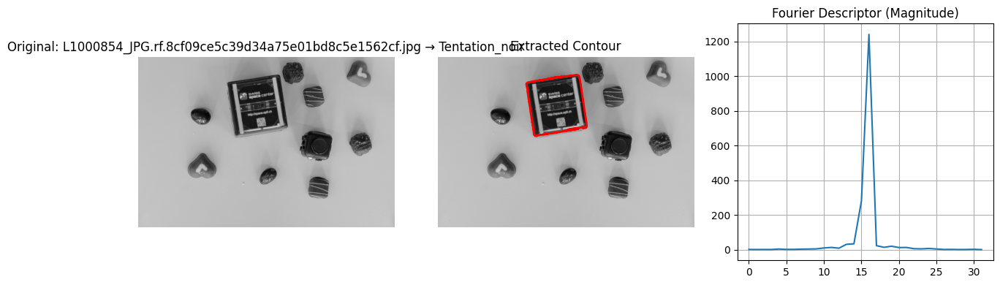


Processing L1000900_JPG.rf.2959d78d15c75224722cc3a256313c58.jpg
  Classified as: Jelly_White


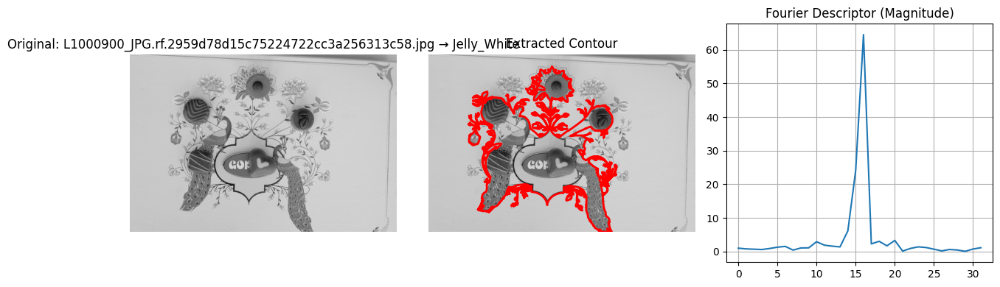


Processing L1000910_JPG.rf.885dd5dbbeddabd94af45e77bfcdd458.jpg
  Classified as: Noir_authentique


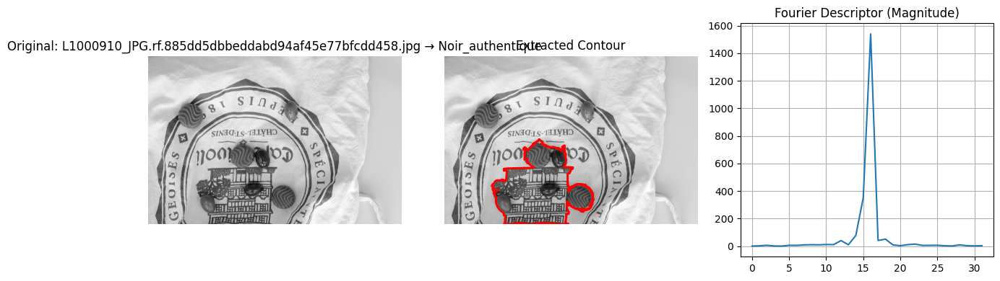


Processing L1000914_JPG.rf.b8834d031b3e1518c8838176a05da276.jpg
  Classified as: Noir_authentique


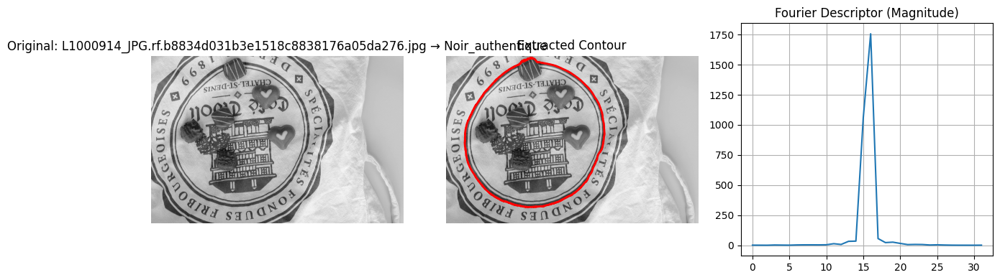


Processing L1000916_JPG.rf.93edcce57def6e66bed60f342fea96b2.jpg
  Classified as: Amandina


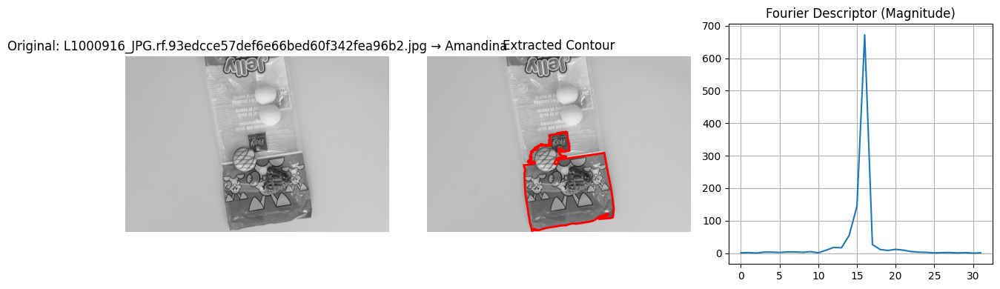


Processing L1000939_JPG.rf.19845d7b5e3667e08b29788189ca4723.jpg
  Classified as: Comtesse


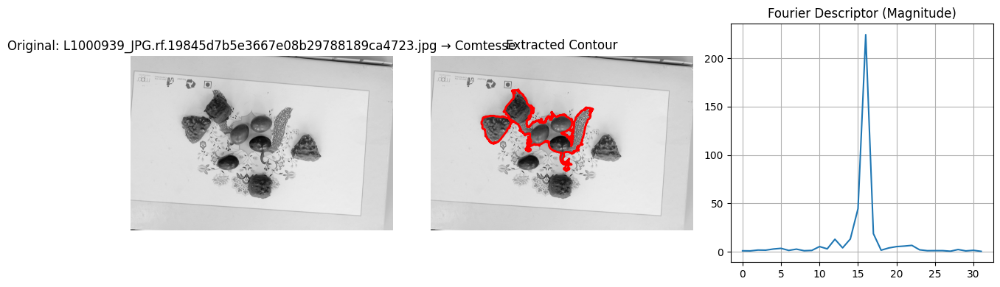


Processing L1000946_JPG.rf.60239831a70d430af2bfecf9f663b38e.jpg
  Classified as: Tentation_noir


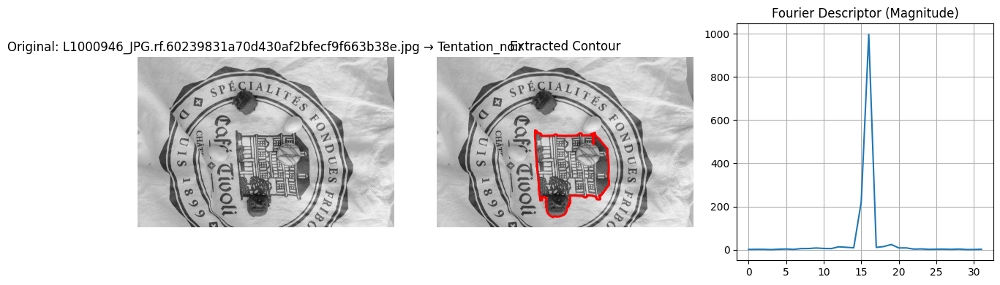


Processing L1000957_JPG.rf.9daecb86cf87a8433e3ed5f7bb529fad.jpg
  Classified as: Jelly_White


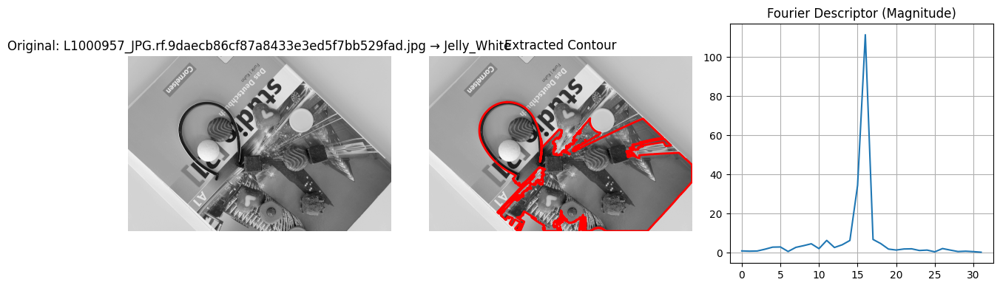


Processing L1000963_JPG.rf.6705066d4a7dc4928afebcf4ca5fe3e7.jpg
  Classified as: Jelly_White


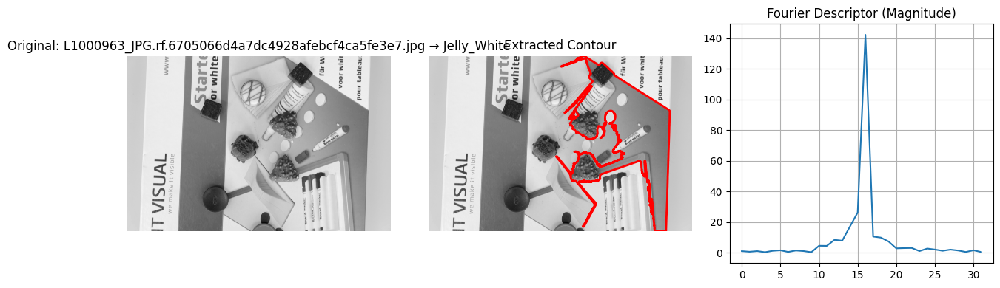


Processing L1000977_JPG.rf.7e9521f316786881ad565e03e136bf94.jpg
  Classified as: Tentation_noir


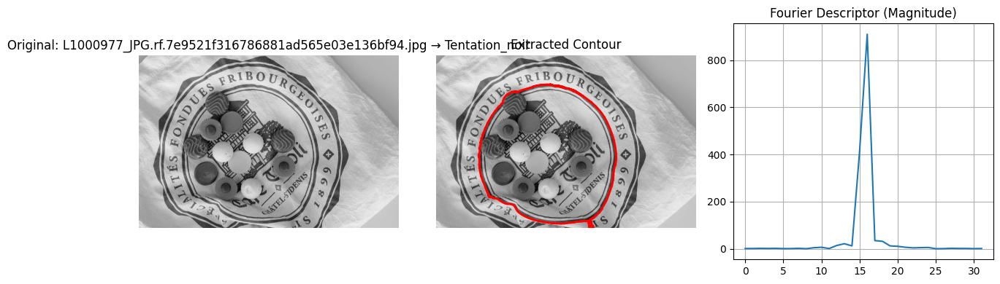


Processing L1000979_JPG.rf.f41990dde2eed03d4d40d1c6ed7c6646.jpg
  Classified as: Jelly_White


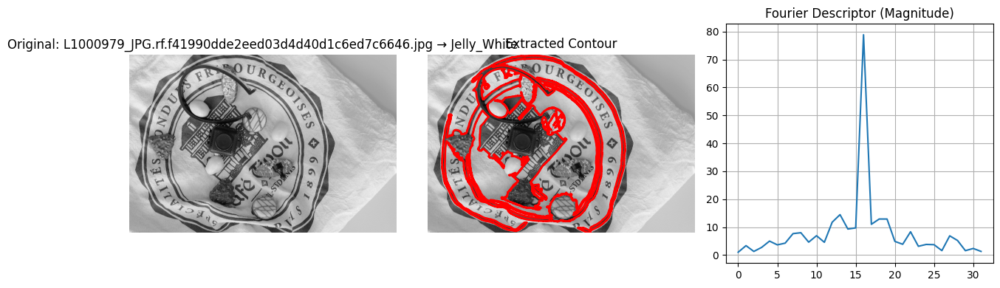


Processing L1000981_JPG.rf.23a5fcdb4cb90a2395f402132988a816.jpg
  Classified as: Tentation_noir


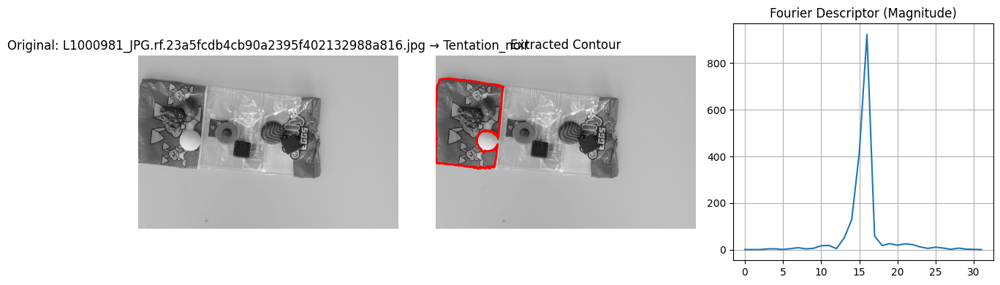


Processing L1000993_JPG.rf.7e4798d004b83cfff07ad2ffe3366f6d.jpg
  Classified as: Jelly_White


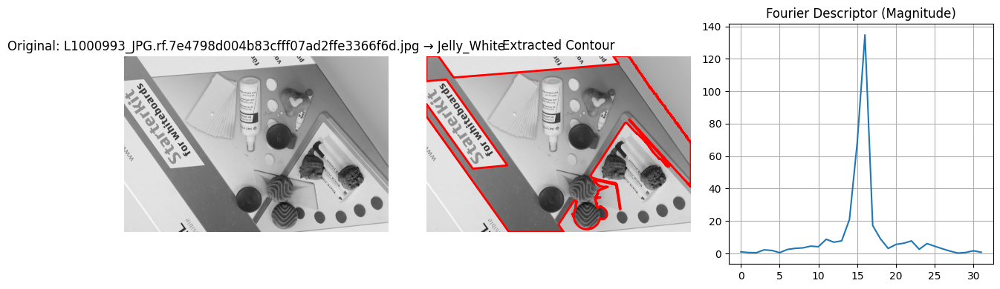


Processing L1010031_JPG.rf.93e9a0f19652e3c6ad6052e4dc770185.jpg
  Classified as: Comtesse


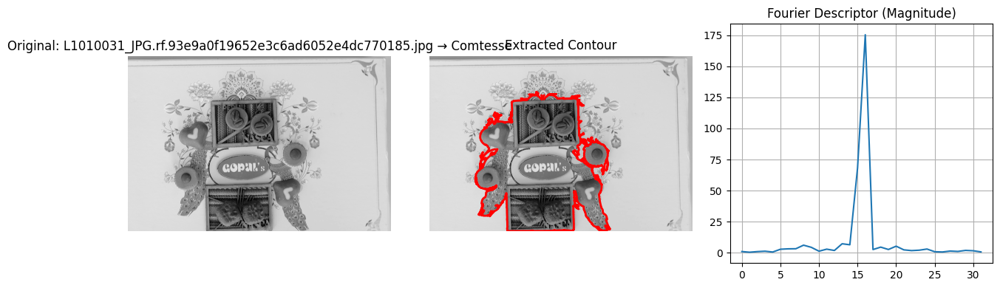


Processing L1010035_JPG.rf.858f2feb48b2af02211d78cc1bc78e09.jpg
  Classified as: Comtesse


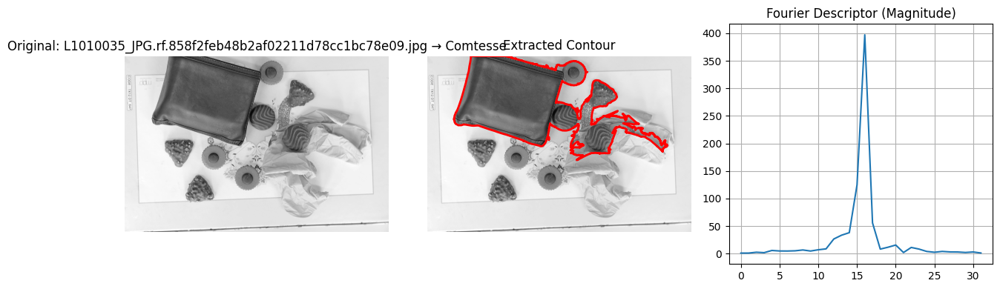


Processing Stracciatella_JPG.rf.0330d3fee1e1133d7a1766e64f048c57.jpg
  Classified as: Tentation_noir


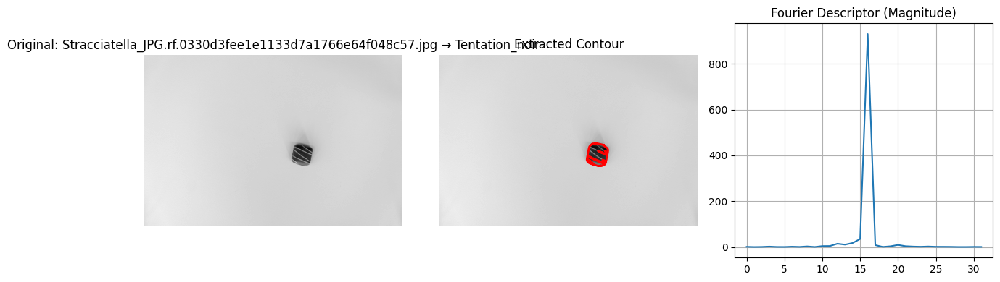

In [76]:
reference_folder = r'images\references'
test_folder = r'images\robo\valid'

reference_fds = build_fourier_descriptors(reference_folder, visualize=True)
process_test_images(test_folder, reference_fds, visualize=True)
